<a href="https://colab.research.google.com/github/fadilaha/Ising-Model-on-Social-Opinion-Dynamic/blob/main/HeatBathDynamics_IntrinsicGrowth_ExternalField.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

__ISING MODEL SIMULATION WITH HEAT BATH DYNAMICS__  
The previous Glauber Scheme simulation considered a three-state opinion system consisting of positive (+1), negative (-1), and neutral (0) sentiments, where positive and negative opinions could not transition directly to the neutral state. In this section, this restriction is removed, allowing each spin to transition between all three possible states.  

  
For each selected spin, the probabilities of the three possible states are calculated based on their corresponding energies under the current effective field. These probabilities are represented as consecutive intervals on a number line from 0 to 1. A random number is then generated within this range, and the interval containing the random number determines the spin's new state

In [19]:
import numpy as np
import matplotlib.pyplot as plt

#Load Same Extrernal Event Schedule from Glauber Scheme.
external_events = np.load("external_events.npy").tolist()
print("External events:", external_events)

def simulate_open_population(N_up_initial, N_down_initial, N_o, T, h, J, q, r_growth, steps, external_events, dt=1.0):
    kB = 1
    # INITIAL POPULATION
    spins = ([1] * N_up_initial + [-1] * N_down_initial + [0] * N_o)
    np.random.shuffle(spins)
    N_up = N_up_initial
    N_down = N_down_initial
    N_neutral = N_o

    #DATA STORAGE
    Data_N_up = []
    Data_N_down = []
    Data_N_neutral = []
    Data_M = []
    Data_N_total = []
    Data_h_ext = []
    Data_h_eff = []
    spin_history = []

    # INITIAL DATA
    N = len(spins)
    M = (N_up - N_down) / N

    Data_N_up.append(N_up)
    Data_N_down.append(N_down)
    Data_N_neutral.append(N_neutral)
    Data_M.append(M)
    Data_N_total.append(N)
    Data_h_ext.append(h)
    Data_h_eff.append(h + J * q * M)
    spin_history.append(spins.copy())

    # MAIN SIMULATION
    for step in range(1, steps + 1):

        # 1. CALCULATE TOTAL EXTERNAL FIELD
        h_ext = 0.0
        decay_rate = 0.1

        for event_time, event_amplitude in external_events:
            if step >= event_time:
                age = step - event_time
                decay = event_amplitude * np.exp(-decay_rate * age)
                h_ext += decay

        # 2. INTRINSIC GROWTH
        N = len(spins)
        M = (N_up - N_down) / N

        # dN/dt = r*N*M
        dNdt = r_growth * N * M
        dN = dNdt * dt
        # Positive M -> new positive population
        if dN > 0:
            new_population = int(np.floor(dN))
            if new_population > 0:
                    spins.extend([1] * new_population)
                    N_up += new_population
                # Negative M -> new negative population
        elif dN < 0:
            new_population = int(np.floor(abs(dN)))
            if new_population > 0:
                    spins.extend([-1] * new_population)
                    N_down += new_population

        # Update total N and M
        N = len(spins)
        M = (N_up - N_down) / N

        # 4. HEAT-BATH SPIN DYNAMICS
        # N random spin-update attempts = 1 MCS
        for _ in range(N):
            # Current M
            M = (N_up - N_down) / N
            # Current mean-field effective field
            h_eff = h_ext + J * q * M

            # Randomly choose one individual
            i = np.random.randint(0, N)
            sigma_old = spins[i]

            # Heat-bath probabilities for all 3 states
            possible_states = np.array([-1, 0, 1])
            energies = -possible_states * h_eff
            weights = np.exp(np.clip(-energies / (kB * T), -100, 100))
            probabilities = weights / np.sum(weights)

            # Draw new state
            sigma_new = np.random.choice(possible_states, p=probabilities)
            if sigma_new != sigma_old:
                # Remove old state
                if sigma_old == 1:
                    N_up -= 1
                elif sigma_old == -1:
                    N_down -= 1
                elif sigma_old == 0:
                    N_neutral -= 1
                # Add new state
                if sigma_new == 1:
                    N_up += 1
                elif sigma_new == -1:
                    N_down += 1
                elif sigma_new == 0:
                    N_neutral += 1
            # Update spin
            spins[i] = sigma_new

        # 5. FINAL M AFTER THIS TIMESTEP
        M = (N_up - N_down) / N

        # Final effective field after Heat-Bath dynamics
        h_eff = h + h_ext + J * q * M

        # 6. STORE DATA
        Data_N_up.append(N_up)
        Data_N_down.append(N_down)
        Data_N_neutral.append(N_neutral)
        Data_M.append(M)
        Data_N_total.append(N)
        Data_h_ext.append(h_ext)
        Data_h_eff.append(h_eff)
        spin_history.append(spins.copy())
         # PROGRESS
        if step % 10 == 0:
            print(f"MCS {step}/{steps} selesai | N = {N}")

    return (Data_N_up, Data_N_down, Data_N_neutral, Data_M, Data_N_total,
        Data_h_ext, Data_h_eff, external_events, spin_history)

External events: [[9.0, 0.21], [15.0, 0.21], [35.0, -0.21], [40.0, -0.21], [46.0, 0.21], [60.0, 0.21], [68.0, -0.21], [82.0, -0.21], [87.0, -0.21], [99.0, -0.21], [116.0, -0.21], [145.0, -0.21], [149.0, 0.21], [161.0, 0.21], [169.0, -0.21], [174.0, 0.21], [191.0, -0.21]]


In [20]:
#PARAMETER INPUT
N_up_initial = 3130
N_down_initial = 1319
N_o = 602

External_field = 0
J_coupling = 0.3
q_neighbors = 4.0

r_growth = 0.001
Temperature = 1.2
Time_steps = 200

np.random.seed(42)
#EXTERNAL EVENTS IS GENERATED ON GLAUBER'S NOTEBOOK

#RUN SIMULATION
results = simulate_open_population(N_up_initial, N_down_initial, N_o, Temperature, External_field, J_coupling,
    q_neighbors, r_growth, Time_steps, external_events, dt=1.0)

(N_up_history, N_down_history, N_neutral_history, M_history, N_total_history,
    h_ext_history, h_eff_history, external_events, spin_history) = results

MCS 10/200 selesai | N = 5053
MCS 20/200 selesai | N = 5058
MCS 30/200 selesai | N = 5066
MCS 40/200 selesai | N = 5066
MCS 50/200 selesai | N = 5073
MCS 60/200 selesai | N = 5073
MCS 70/200 selesai | N = 5077
MCS 80/200 selesai | N = 5077
MCS 90/200 selesai | N = 5084
MCS 100/200 selesai | N = 5094
MCS 110/200 selesai | N = 5104
MCS 120/200 selesai | N = 5111
MCS 130/200 selesai | N = 5118
MCS 140/200 selesai | N = 5118
MCS 150/200 selesai | N = 5121
MCS 160/200 selesai | N = 5121
MCS 170/200 selesai | N = 5125
MCS 180/200 selesai | N = 5125
MCS 190/200 selesai | N = 5125
MCS 200/200 selesai | N = 5125


In [21]:
#SHOW THE DETAILS OF EXTERNAL FIELD APPEARANCES
print("External field events:")

for event_time, event_amplitude in external_events:
    print(
        f"t = {event_time}: "
        f"h = {event_amplitude:+.1f}")

External field events:
t = 9.0: h = +0.2
t = 15.0: h = +0.2
t = 35.0: h = -0.2
t = 40.0: h = -0.2
t = 46.0: h = +0.2
t = 60.0: h = +0.2
t = 68.0: h = -0.2
t = 82.0: h = -0.2
t = 87.0: h = -0.2
t = 99.0: h = -0.2
t = 116.0: h = -0.2
t = 145.0: h = -0.2
t = 149.0: h = +0.2
t = 161.0: h = +0.2
t = 169.0: h = -0.2
t = 174.0: h = +0.2
t = 191.0: h = -0.2


__GRAPHS SECTION__

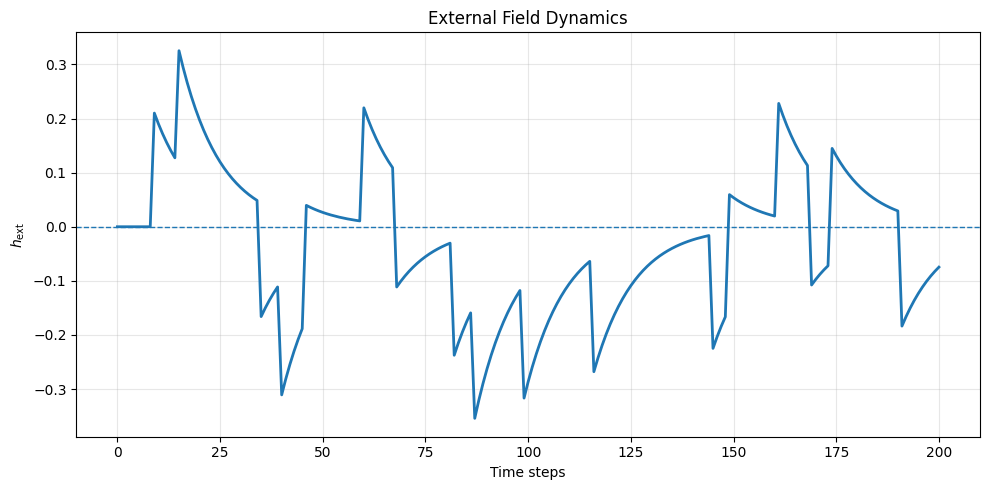

In [22]:
#PLOT EXTERNAL FIELD

time = np.arange(len(h_ext_history))
plt.figure(figsize=(10, 5))

plt.plot(
    time,
    h_ext_history,
    linewidth=2
)

plt.axhline(
    0,
    linestyle='--',
    linewidth=1
)

plt.xlabel("Time steps")
plt.ylabel(r"$h_{\mathrm{ext}}$")
plt.title("External Field Dynamics")

plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

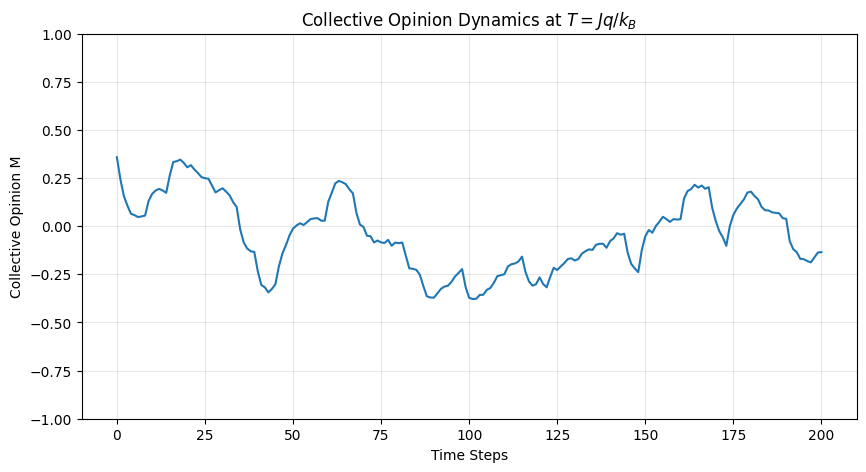

In [23]:
plt.figure(figsize=(10, 5))
plt.plot(M_history)
plt.xlabel("Time Steps")
plt.ylabel("Collective Opinion M")
plt.title(r"Collective Opinion Dynamics at $T=Jq/k_B$")
plt.ylim(-1,1)
plt.grid(alpha=0.3)
plt.show()

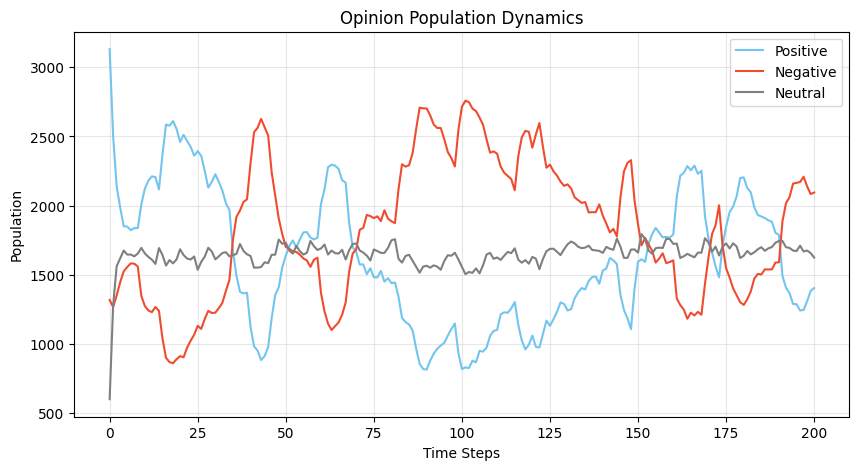

In [24]:
plt.figure(figsize=(10, 5))

plt.plot(N_up_history, color="#72C5EF", label="Positive")
plt.plot(N_down_history, color="#F04B2F", label="Negative")
plt.plot(N_neutral_history, color="#7F7F7F", label="Neutral")
plt.xlabel("Time Steps")
plt.ylabel("Population")
plt.title("Opinion Population Dynamics")
plt.legend()
plt.grid(alpha=0.3)
plt.show()

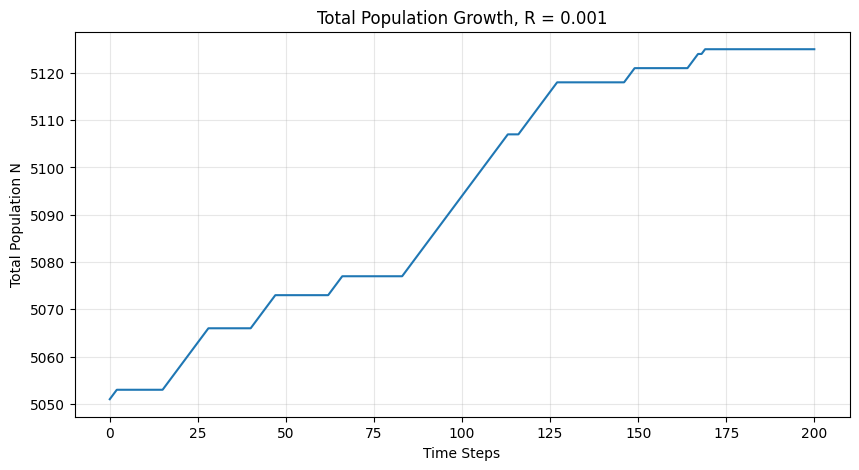

In [25]:
plt.figure(figsize=(10, 5))
plt.plot(N_total_history)
plt.xlabel("Time Steps")
plt.ylabel("Total Population N")
plt.title(f"Total Population Growth, R = {r_growth}")
plt.grid(alpha=0.3)
plt.show()

__INTERACTIVE OUTPUT SECTION (GIF, DYNAMIC LATTICE MAP, TOPOGRAPHY MAP)__

In [26]:
#GENERATE COLLECTIVE OPINION M GRAPH IN GIF
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation, PillowWriter

# PARAMETERS
MCS = np.arange(len(M_history))

# FIGURE
fig, ax = plt.subplots(figsize=(8, 5))

ax.set_xlim(0, len(M_history))
ax.set_ylim(-1, 1)

ax.set_xlabel("Time Steps")
ax.set_ylabel("Collective Opinion M")
ax.set_title(r"Collective Opinion Dynamics at $T=Jq/k_B$")

ax.axhline(0, linestyle="--", linewidth=1)

line, = ax.plot([], [], linewidth=2, color="#73C5EF")

# Text showing current MCS
text = ax.text(
    0.02, 0.95, "",
    transform=ax.transAxes,
    verticalalignment="top"
)

def init():
    line.set_data([], [])
    text.set_text("")
    return line, text

def update(frame):
    x = MCS[:frame + 1]
    y = np.array(M_history[:frame + 1])

    line.set_data(x, y)

    text.set_text(
        f"MCS = {frame + 1}\n"
        f"M = {y[-1]:.3f}"
    )

    return line, text

ani = FuncAnimation(
    fig,
    update,
    frames=len(M_history),
    init_func=init,
    interval=50,
    blit=True
)

ani.save(
    "collective_opinion_dynamics_HB.gif",
    writer=PillowWriter(fps=20)
)

plt.close(fig)

print("GIF saved as collective_opinion_dynamics_HB.gif")

GIF saved as collective_opinion_dynamics_HB.gif


In [27]:
#GENERATE POPULATION DYNAMICS GRAPH IN GIF
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation, PillowWriter

# PARAMETERS
MCS = np.arange(len(N_up_history))

positive_color = "#73C5EF"
negative_color = "#F04B2F"
neutral_color  = "#7F7F7F"

# FIGURE
fig, ax = plt.subplots(figsize=(8, 5))

ax.set_xlim(0, len(N_up_history))

max_population = max(
    max(N_up_history),
    max(N_down_history),
    max(N_neutral_history)
)

ax.set_ylim(0, max_population * 1.1)

ax.set_xlabel("Time Steps")
ax.set_ylabel("Number of Individuals")

ax.set_title(
    r"Opinion Dynamics at $T=Jq/k_B$"
)

# EMPTY LINES
line_positive, = ax.plot(
    [], [],
    linewidth=2,
    color=positive_color,
    label="Positive (+1)"
)

line_negative, = ax.plot(
    [], [],
    linewidth=2,
    color=negative_color,
    label="Negative (-1)"
)

line_neutral, = ax.plot(
    [], [],
    linewidth=2,
    color=neutral_color,
    label="Neutral (0)"
)

ax.legend()

# MCS TEXT
text = ax.text(
    0.02, 0.95, "",
    transform=ax.transAxes,
    verticalalignment="top"
)

# INITIALIZATION
def init():
    line_positive.set_data([], [])
    line_negative.set_data([], [])
    line_neutral.set_data([], [])
    text.set_text("")

    return (
        line_positive,
        line_negative,
        line_neutral,
        text
    )

# ANIMATION
def update(frame):

    x = MCS[:frame + 1]

    line_positive.set_data(
        x,
        N_up_history[:frame + 1]
    )

    line_negative.set_data(
        x,
        N_down_history[:frame + 1]
    )

    line_neutral.set_data(
        x,
        N_neutral_history[:frame + 1]
    )

    text.set_text(
        f"MCS = {frame + 1}"
    )

    return (
        line_positive,
        line_negative,
        line_neutral,
        text
    )

ani = FuncAnimation(
    fig,
    update,
    frames=len(N_up_history),
    init_func=init,
    interval=50,
    blit=True
)

ani.save(
    "opinion_population_dynamics_HB.gif",
    writer=PillowWriter(fps=20)
)

plt.close(fig)

print("GIF saved as opinion_population_dynamics_HB.gif")

GIF saved as opinion_population_dynamics_HB.gif


In [28]:
#DYNAMIC MAP OF THE LATTICE
from IPython.display import HTML, display
import json
import numpy as np

# Prepare spin data
spin_data = [np.asarray(s).tolist() for s in spin_history]

M_data = np.asarray(M_history).tolist()
N_data = np.asarray(N_total_history).tolist()

html = f"""
<div style="font-family: Arial; width: 650px;">

    <h3>Dynamic Ising Opinion Evolution Map</h3>

    <canvas id="opinionCanvas"
            width="600"
            height="600"
            style="border:1px solid black;">
    </canvas>

    <br><br>

    <input
        type="range"
        id="timeSlider"
        min="0"
        max="{len(spin_data)-1}"
        value="0"
        step="1"
        style="width:600px;"
    >

    <br><br>

    <button id="playButton">
        ▶ Play
    </button>

    <p>
        MCS:
        <span id="mcsValue">0</span>
        &nbsp;&nbsp;&nbsp;

        M:
        <span id="magValue">---</span>

        &nbsp;&nbsp;&nbsp;

        N:
        <span id="NValue">---</span>
    </p>

</div>

<script>

(function(){{

    const spinData = {json.dumps(spin_data)};
    const magnetization = {json.dumps(M_data)};
    const population = {json.dumps(N_data)};

    const canvas = document.getElementById("opinionCanvas");
    const ctx = canvas.getContext("2d");

    const slider = document.getElementById("timeSlider");
    const playButton = document.getElementById("playButton");

    const mcsText = document.getElementById("mcsValue");
    const magText = document.getElementById("magValue");
    const NText = document.getElementById("NValue");

    let playing = false;
    let animationTimer = null;

    // =========================
    // Draw map
    // =========================

    function drawMap(mcs) {{

        const spins = spinData[mcs];

        const N = spins.length;

        const gridSize = Math.ceil(Math.sqrt(N));

        ctx.clearRect(
            0,
            0,
            canvas.width,
            canvas.height
        );

        ctx.fillStyle = "white";

        ctx.fillRect(
            0,
            0,
            canvas.width,
            canvas.height
        );

        const cellSize = canvas.width / gridSize;

        for (let i = 0; i < N; i++) {{

            const row = Math.floor(i / gridSize);
            const col = i % gridSize;

            const x = col * cellSize;
            const y = row * cellSize;

            const spin = spins[i];
            if (spin === 1) {{
                ctx.fillStyle = "#73C5EF";
            }}
            else if (spin === -1) {{
                ctx.fillStyle = "#F04B2F";
            }}
            else {{
                ctx.fillStyle = "#7F7F7F";
            }}

            ctx.fillRect(
                x,
                y,
                cellSize,
                cellSize
            );
        }}

        // Display information

        mcsText.textContent = mcs;

        if (mcs < magnetization.length) {{
            magText.textContent =
                magnetization[mcs].toFixed(4);
        }}
        else {{
            magText.textContent = "---";
        }}

        if (mcs < population.length) {{
            NText.textContent = population[mcs];
        }}
        else {{
            NText.textContent = "---";
        }}
    }}

    // =========================
    // Slider
    // =========================

    slider.addEventListener(
        "input",
        function() {{
            drawMap(parseInt(this.value));
        }}
    );

    // =========================
    // Play / Pause
    // =========================

    playButton.addEventListener(
        "click",
        function() {{

            if (playing) {{

                playing = false;

                clearInterval(animationTimer);

                playButton.textContent = "▶ Play";

            }} else {{

                playing = true;

                playButton.textContent = "⏸ Pause";

                animationTimer = setInterval(
                    function() {{

                        let current =
                            parseInt(slider.value);

                        if (current >= spinData.length - 1) {{

                            playing = false;

                            clearInterval(animationTimer);

                            playButton.textContent = "▶ Play";

                            return;
                        }}

                        current += 1;

                        slider.value = current;

                        drawMap(current);

                    }},
                    50
                );
            }}
        }}
    );

    // =========================
    // Initial map
    // =========================

    drawMap(0);

}})();

</script>
"""

display(HTML(html))

In [29]:
#GENERATE LATTICE DYNAMIC MAP GIF
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation, PillowWriter
from matplotlib.colors import ListedColormap, BoundaryNorm

#COLOR PALLETTE
negative_color = "#F04B2F"   # -1
neutral_color  = "#7F7F7F"   #  0
positive_color = "#73C5EF"   # +1
empty_color    = "white"     # padding

#CUSTOM COLORMAP
cmap = ListedColormap([
    negative_color,
    neutral_color,
    positive_color
])
#Color for empty cells
cmap.set_bad(color=empty_color)

norm = BoundaryNorm([-1.5, -0.5, 0.5, 1.5],cmap.N)

#FIGURE
fig, ax = plt.subplots(figsize=(6, 6))

def update(frame):
    ax.clear()

    spins = np.asarray(spin_history[frame])
    N = len(spins)

    grid_size = int(np.ceil(np.sqrt(N)))

    # Make a square grid
    padded = np.full(grid_size**2, np.nan)
    padded[:N] = spins
    grid = padded.reshape(grid_size, grid_size)

    # +1 = light blue, 0 = gray, -1 = red
    ax.imshow(
        grid,
        cmap=cmap,
        norm=norm,
        interpolation="nearest"
    )

    ax.set_title(
        f"MCS: {frame} | "
        f"M = {M_history[frame]:.3f} | "
        f"N = {N_total_history[frame]}"
    )

    ax.set_xticks([])
    ax.set_yticks([])


anim = FuncAnimation(
    fig,
    update,
    frames=len(spin_history),
    interval=50,
    repeat=False
)

# Save as GIF
anim.save(
    "dynamic_ising_map_HB.gif",
    writer=PillowWriter(fps=10)
)

plt.close(fig)

print("GIF saved as dynamic_ising_map_HB.gif")

GIF saved as dynamic_ising_map_HB.gif


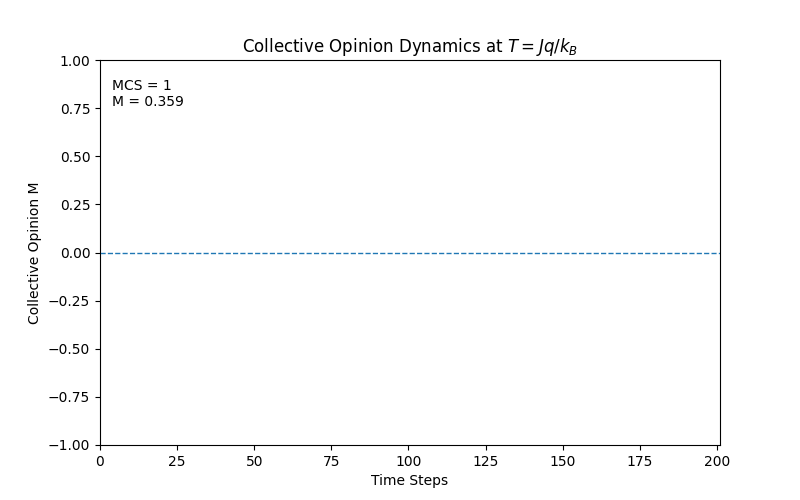

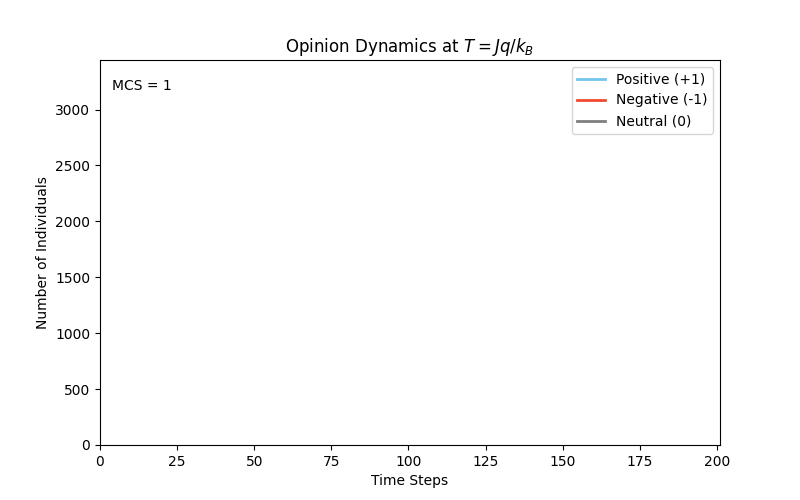

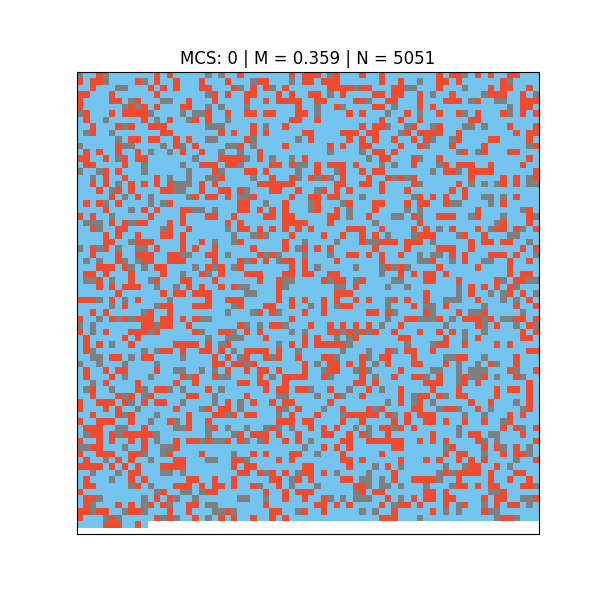

In [30]:
#DISPLAY THE GIFS
from IPython.display import Image, display
#Adjust the Path File Here
display(Image("collective_opinion_dynamics_HB.gif"))
display(Image("opinion_population_dynamics_HB.gif"))
display(Image("dynamic_ising_map_HB.gif"))

In [31]:
#3D GRAPH OF COLLECTIVE OPINION AND OPINION OVER TIME
import numpy as np
import plotly.graph_objects as go

# DATA
mcs = np.arange(len(N_up_history))

N_up = np.asarray(N_up_history)
N_down = np.asarray(N_down_history)
N_neutral = np.asarray(N_neutral_history)

N_total = np.asarray(N_total_history)
M_data = np.asarray(M_history)

# Opinion states
# -1 = Negative
#  0 = Neutral
# +1 = Positive
opinions = np.array([-1, 0, 1])

# Population for each opinion
population = np.vstack([
    N_down,
    N_neutral,
    N_up
])

# Mesh for initial surface
X, Y = np.meshgrid(mcs, opinions)

# Opinion Color
colorscale = [
    [0.0, "#F04B2F"],   # Negative
    [0.5, "#7F7F7F"],   # Neutral
    [1.0, "#72C5EF"]    # Positive
]

# INITIAL FIGURE
fig = go.Figure(
    data=[
        go.Surface(
            x=X,
            y=Y,
            z=population,

            # Color based on opinion
            surfacecolor=Y,

            colorscale=colorscale,
            cmin=-1,
            cmax=1,

            showscale=False
        )
    ]
)

# FRAMES FOR ANIMATION
frames = []

for i in range(len(mcs)):

    # Only shows data until i-th step
    current_mcs = mcs[:i+1]

    X_frame, Y_frame = np.meshgrid(
        current_mcs,
        opinions
    )

    Z_frame = population[:, :i+1]

    frames.append(
        go.Frame(

            # Surface at current step
            data=[
                go.Surface(
                    x=X_frame,
                    y=Y_frame,
                    z=Z_frame,

                    surfacecolor=Y_frame,

                    colorscale=colorscale,
                    cmin=-1,
                    cmax=1,

                    showscale=False
                )
            ],

            # Frame name
            name=str(i),

            # INFORMATION TEXT ON TOP OF MAP
            layout=go.Layout(
                title=dict(
                    text=(
                        "Evolution of Opinion Population"
                        "<br>"
                        "<b>Heat Bath Scheme</b>"
                        "<br>"
                        f"<b>Step = {i} &nbsp;&nbsp; "
                        f"| &nbsp;&nbsp; N = {N_total[i]:,} "
                        f"&nbsp;&nbsp; | &nbsp;&nbsp; "
                        f"M = {M_data[i]:.3f}</b>"
                    )
                )
            )
        )
    )


fig.frames = frames

# LAYOUT
fig.update_layout(

    title=dict(
        text=(
            "Evolution of Opinion Population"
            "<br>"
            "<b>Heat Bath Scheme</b>"
            "<br>"
            f"<b>Step = {mcs[0]} &nbsp;&nbsp; "
            f"| &nbsp;&nbsp; N = {N_total[0]:,} "
            f"&nbsp;&nbsp; | &nbsp;&nbsp; "
            f"M = {M_data[0]:.3f}</b>"
        ),
        x=0.5,
        y=0.89
    ),

    # Adjust distance of title and graph
    margin=dict(
        l=0,
        r=0,
        b=0,
        t=35
    ),

    # 3D SCENE
    scene=dict(

        xaxis=dict(
            title="Time (Step)",
            range=[0, mcs[-1]]
        ),

        yaxis=dict(
            title="Opinion",

            tickmode="array",
            tickvals=[-1, 0, 1],
            ticktext=[
                "Negative",
                "Neutral",
                "Positive"
            ],

            range=[-1, 1]
        ),

        zaxis=dict(
            title="Number of Agents",
            range=[
                0,
                np.max(N_total) * 1.1
            ]
        )
    ),

    # PLAY BUTTON
    updatemenus=[
        {
            "type": "buttons",
            "showactive": False,

            "buttons": [
                {
                    "label": "▶ Play",

                    "method": "animate",

                    "args": [
                        None,

                        {
                            "frame": {
                                "duration": 100,
                                "redraw": True
                            },

                            "transition": {
                                "duration": 0
                            },

                            "fromcurrent": True
                        }
                    ]
                }
            ]
        }
    ],

    # SLIDER
    sliders=[
        {
            "active": 0,

            "currentvalue": {
                "prefix": "Step: "
            },

            "steps": [

                {
                    "args": [
                        [str(i)],

                        {
                            "frame": {
                                "duration": 0,
                                "redraw": True
                            },

                            "transition": {
                                "duration": 0
                            },

                            "mode": "immediate"
                        }
                    ],

                    "label": str(i),

                    "method": "animate"
                }

                for i in range(len(mcs))
            ]
        }
    ],

    width=1000,
    height=700
)


# SHOW
fig.show()